# Exploring CSI-RS Configurations

This notebook demonstrates how **NeoRadium** implements the Channel State Information Reference Signal (CSI-RS) configurations defined in 3GPP TS 38.211, Table 7.4.1.5.3-1.

The notebook walks through examples corresponding to all 18 CSI-RS configuration rows in the specification and visualizes the resulting resource-element allocations. Each example creates a CSI-RS configuration, maps it to a resource grid, and displays the CSI-RS locations for the configured antenna ports.

The examples illustrate how CSI-RS allocation changes with different parameters, including:

- The number of CSI-RS antenna ports
- Frequency-domain allocation patterns (`freqMap`)
- CSI-RS density values
- CDM group sizes (`cdmSize`)
- Time-domain symbol locations
- Multi-port CSI-RS configurations

For each configuration, the notebook displays the populated resource grid and reports allocation statistics, making it easy to compare the CSI-RS patterns defined by different rows of the standard.

By examining these examples side by side, you can develop an intuitive understanding of how CSI-RS resources are distributed across time, frequency, and antenna ports, and how **NeoRadium** represents the CSI-RS configurations specified by 5G NR.

In [1]:
import numpy as np
import scipy.io

from neoradium import Carrier, PDSCH, Grid, CsiRsConfig, CsiRsSet

In [2]:
carrier = Carrier(startRb=0, numRbs=24, spacing=15)
bwp = carrier.bwps[0]
bwp.print()



Bandwidth Part Properties:
  Resource Blocks:    24 RBs starting at 0 (288 subcarriers)
  Subcarrier Spacing: 15 kHz
  CP Type:            normal
  Interleaving:       No
  Bandwidth:          4.32 MHz
  symbolsPerSlot:     14
  slotsPerSubFrame:   1
  nFFT:               2048
  frameNo:            0
  slotNo:             0




CSI-RS Configuration: (1 Resource Sets)
  CSI-RS Resource Set 0:(1 NZP resources)
    Resource Set ID:      0
    Resource Type:        periodic
    Resource Blocks:      24 RBs starting at 0
    Slot Period:          4
    Num CSI-RS:           1
    CSI-RS 0:
      resourceId:         0
      numPorts:           1
      cdmSize:            1 (noCDM)
      density:            3
      RE Indices:         3
      Symbol Indices:     1
      Table Row:          1
      Slot Offset:        0
      Power:              0 dB
      scramblingID:       0

Grid Statistics:
  GridSize: 4032
  UNASSIGNED: 3960
  CSIRS_NZP(0): 72


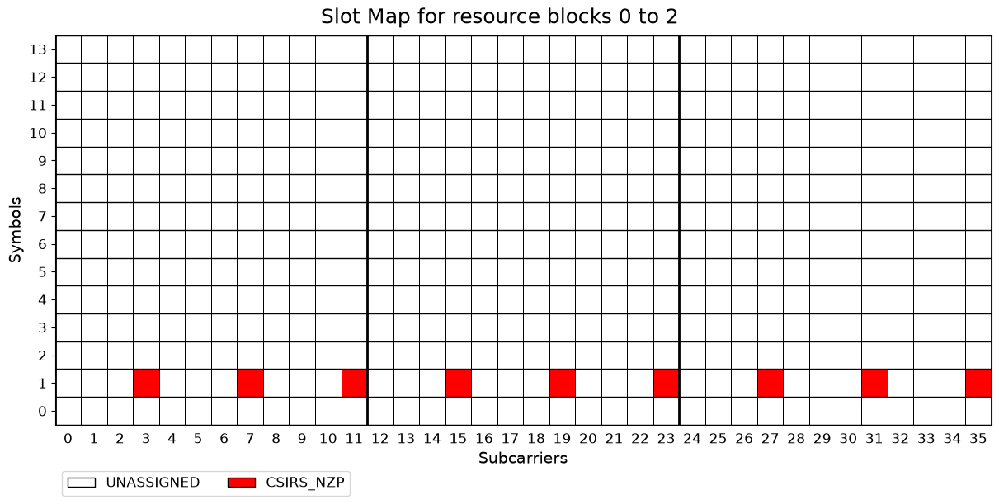

In [3]:
# Example: Row 1 of 38.211 Table 7.4.1.5.3-1
# 1 port, one of the four bits is set in freqMap, CDM size is 1 and density is 3.
# CSI-RS resources are located in OFDM symbol 1 and REs 3, 7, and 11.
csiRsConfig = CsiRsConfig(csiType="NZP", bwp=bwp, symbols=[1], numPorts=1, freqMap="1000", density=3)
csiRsConfig.print()
grid = bwp.createGrid(csiRsConfig.numPorts)
csiRsConfig.populateGrid(grid)
print("Grid Statistics:")
stats = grid.getStats()
for key, value in stats.items(): print("  %s: %d"%(key, value))
grid.drawMap(ports=range(csiRsConfig.numPorts), rbRange=(0,2));


CSI-RS Configuration: (1 Resource Sets)
  CSI-RS Resource Set 0:(1 NZP resources)
    Resource Set ID:      0
    Resource Type:        periodic
    Resource Blocks:      24 RBs starting at 0
    Slot Period:          4
    Num CSI-RS:           1
    CSI-RS 0:
      resourceId:         0
      numPorts:           1
      cdmSize:            1 (noCDM)
      density:            0.5
      RE Indices:         3
      Symbol Indices:     1
      Table Row:          2
      Slot Offset:        0
      Power:              0 dB
      scramblingID:       0

Grid Statistics:
  GridSize: 4032
  UNASSIGNED: 4020
  CSIRS_NZP(0): 12


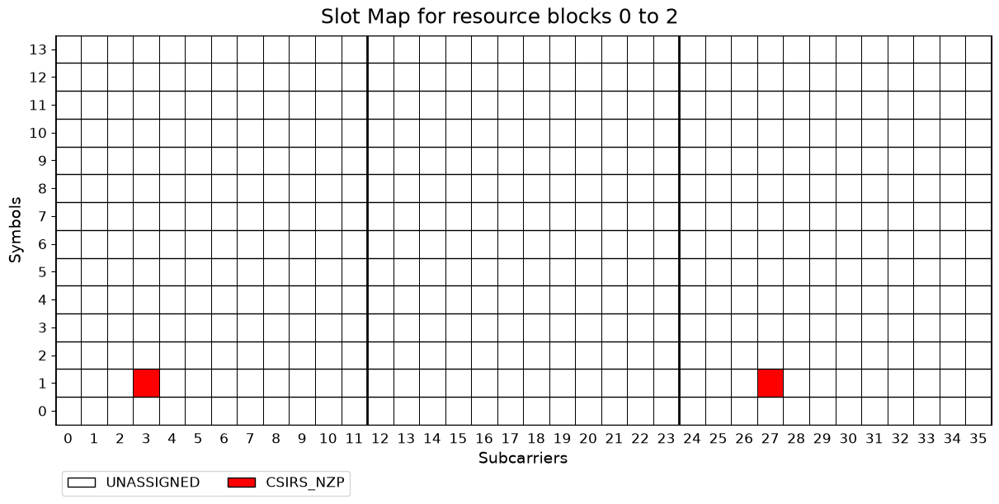

In [4]:
# Example: Row 2 of 38.211 Table 7.4.1.5.3-1 with density=0.5
# 1 port, one of the twelve bits is set in freqMap, CDM size is 1 and density is 0.5.
# CSI-RS resources are located in OFDM symbol 1 and RE 3. Every other RB is skipped.
csiRsConfig = CsiRsConfig()
csiRsConfig.addCsiRs(csiType="NZP", bwp=bwp, symbols=[1], numPorts=1, freqMap="000000001000", density=0.5)
csiRsConfig.print()
grid = bwp.createGrid(csiRsConfig.numPorts)
csiRsConfig.populateGrid(grid)
print("Grid Statistics:")
stats = grid.getStats()
for key, value in stats.items(): print("  %s: %d"%(key, value))
grid.drawMap(ports=range(csiRsConfig.numPorts), rbRange=(0,2));


CSI-RS Configuration: (1 Resource Sets)
  CSI-RS Resource Set 0:(1 NZP resources)
    Resource Set ID:      0
    Resource Type:        periodic
    Resource Blocks:      24 RBs starting at 0
    Slot Period:          4
    Num CSI-RS:           1
    CSI-RS 0:
      resourceId:         0
      numPorts:           1
      cdmSize:            1 (noCDM)
      density:            1
      RE Indices:         3
      Symbol Indices:     3
      Table Row:          2
      Slot Offset:        0
      Power:              0 dB
      scramblingID:       0

Grid Statistics:
  GridSize: 4032
  UNASSIGNED: 4008
  CSIRS_NZP(0): 24


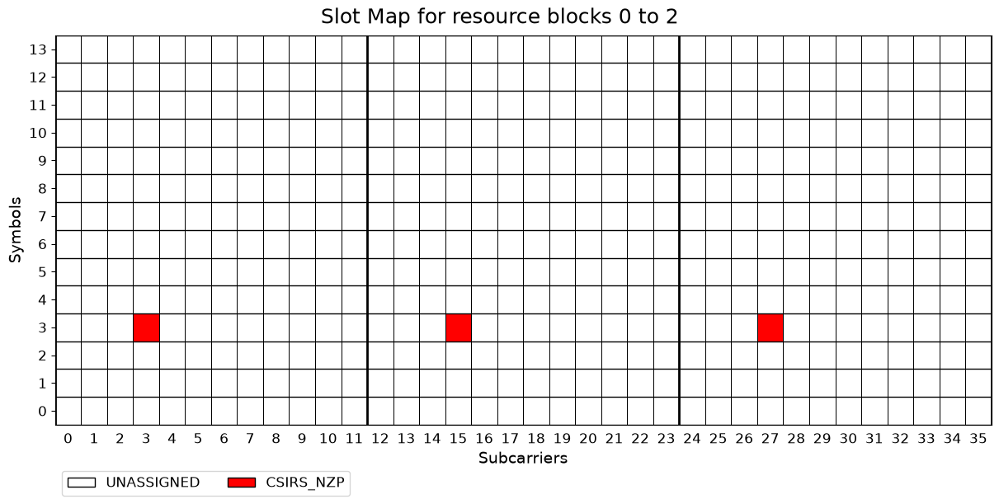

In [5]:
# Example: Row 2 of 38.211 Table 7.4.1.5.3-1 with density=1 using a different symbol (3)
# 1 port, one of the twelve bits is set in freqMap, CDM size is 1 and density is 1.
# CSI-RS resources are located in OFDM symbol 3 and RE 3.
csiRsConfig = CsiRsConfig([CsiRsSet("NZP", bwp, symbols=[3], numPorts=1, freqMap="000000001000", density=1)])
csiRsConfig.print()
grid = bwp.createGrid(csiRsConfig.numPorts)
csiRsConfig.populateGrid(grid)
print("Grid Statistics:")
stats = grid.getStats()
for key, value in stats.items(): print("  %s: %d"%(key, value))
grid.drawMap(ports=range(csiRsConfig.numPorts), rbRange=(0,2));


CSI-RS Configuration: (1 Resource Sets)
  CSI-RS Resource Set 0:(1 NZP resources)
    Resource Set ID:      0
    Resource Type:        periodic
    Resource Blocks:      24 RBs starting at 0
    Slot Period:          4
    Num CSI-RS:           1
    CSI-RS 0:
      resourceId:         0
      numPorts:           2
      cdmSize:            2 (fd-CDM2)
      density:            0.5
      RE Indices:         0
      Symbol Indices:     3
      Table Row:          3
      Slot Offset:        0
      Power:              0 dB
      scramblingID:       0

Grid Statistics:
  GridSize: 8064
  UNASSIGNED: 8016
  CSIRS_NZP(0): 48


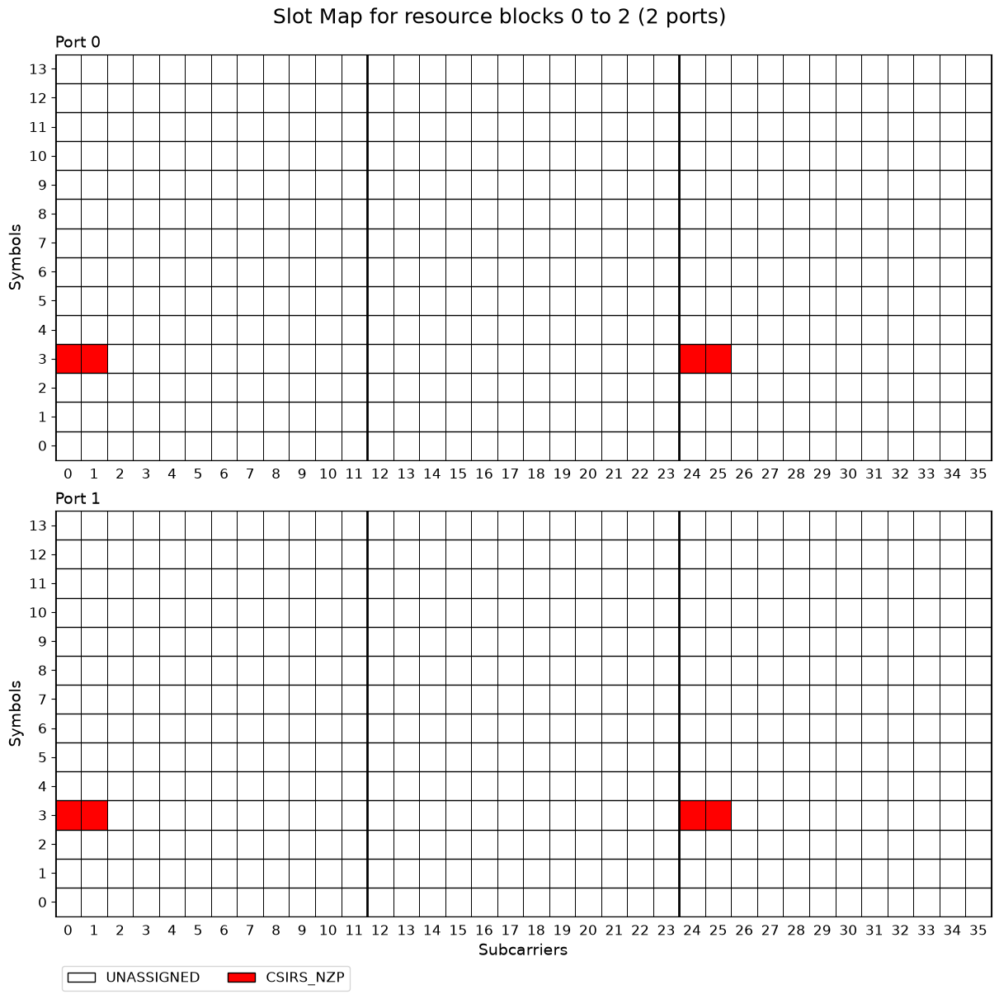

In [6]:
# Example: Row 3 of 38.211 Table 7.4.1.5.3-1 with density=0.5 
# 2 ports, one of the six bits is set in freqMap, CDM size is 2 and density is 0.5.
# CSI-RS resources are located in OFDM symbol 3 and REs (0, 1). Every other RB is skipped.
csiRsConfig = CsiRsConfig([CsiRsSet("NZP", bwp, symbols=[3], numPorts=2, freqMap="000001", density=0.5)])
csiRsConfig.print()
grid = bwp.createGrid(csiRsConfig.numPorts)
csiRsConfig.populateGrid(grid)
print("Grid Statistics:")
stats = grid.getStats()
for key, value in stats.items(): print("  %s: %d"%(key, value))
grid.drawMap(ports=range(csiRsConfig.numPorts), rbRange=(0,2));


CSI-RS Configuration: (1 Resource Sets)
  CSI-RS Resource Set 0:(1 NZP resources)
    Resource Set ID:      0
    Resource Type:        periodic
    Resource Blocks:      24 RBs starting at 0
    Slot Period:          4
    Num CSI-RS:           1
    CSI-RS 0:
      resourceId:         0
      numPorts:           2
      cdmSize:            2 (fd-CDM2)
      density:            1
      RE Indices:         6
      Symbol Indices:     6
      Table Row:          3
      Slot Offset:        0
      Power:              0 dB
      scramblingID:       0

Grid Statistics:
  GridSize: 8064
  UNASSIGNED: 7968
  CSIRS_NZP(0): 96


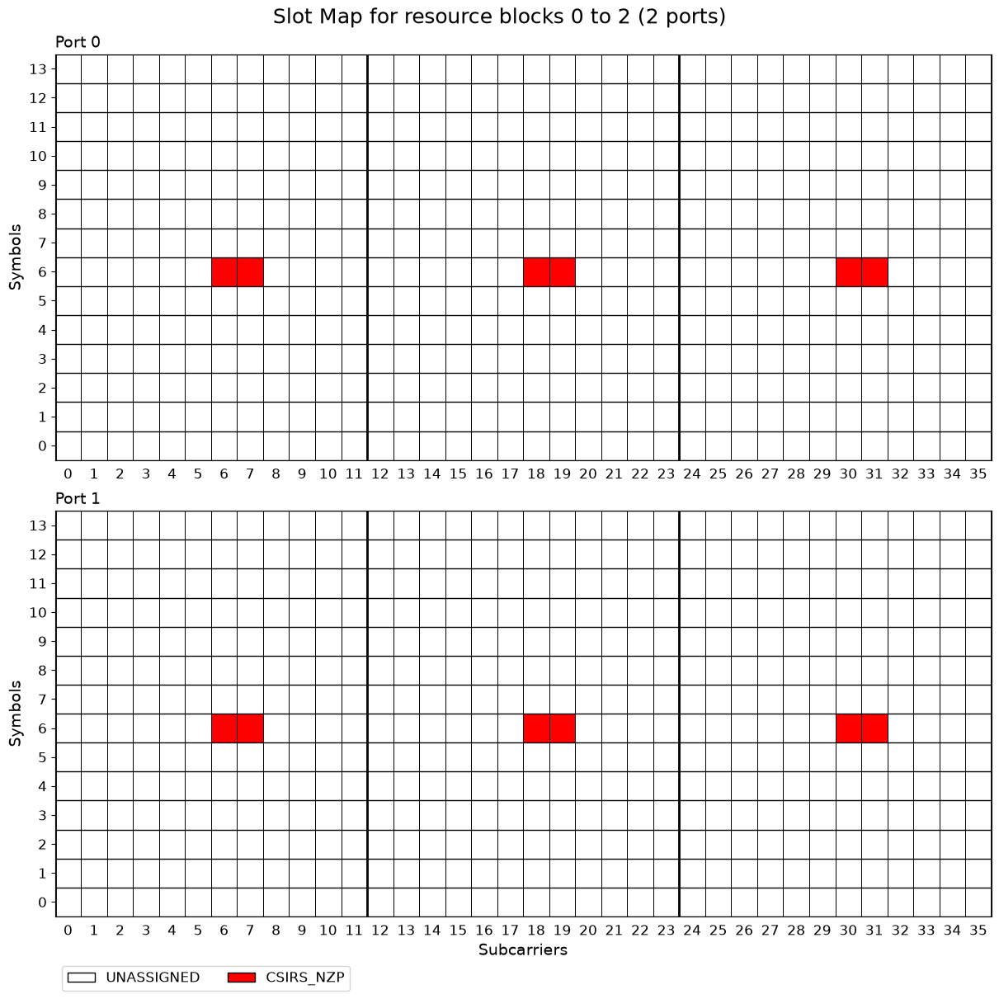

In [7]:
# Example: Row 3 of 38.211 Table 7.4.1.5.3-1 with density=1 using a different symbol (6)
# 2 ports, one of the six bits is set in freqMap, CDM size is 2 and density is 1.
# CSI-RS resources are located in OFDM symbol 6 and REs (6, 7).
csiRsConfig = CsiRsConfig([CsiRsSet("NZP", bwp, symbols=[6], numPorts=2, freqMap="001000", density=1)])
csiRsConfig.print()
grid = bwp.createGrid(csiRsConfig.numPorts)
csiRsConfig.populateGrid(grid)
print("Grid Statistics:")
stats = grid.getStats()
for key, value in stats.items(): print("  %s: %d"%(key, value))
grid.drawMap(ports=range(csiRsConfig.numPorts), rbRange=(0,2));


CSI-RS Configuration: (1 Resource Sets)
  CSI-RS Resource Set 0:(1 NZP resources)
    Resource Set ID:      0
    Resource Type:        periodic
    Resource Blocks:      24 RBs starting at 0
    Slot Period:          4
    Num CSI-RS:           1
    CSI-RS 0:
      resourceId:         0
      numPorts:           4
      cdmSize:            2 (fd-CDM2)
      density:            1
      RE Indices:         4
      Symbol Indices:     6
      Table Row:          4
      Slot Offset:        0
      Power:              0 dB
      scramblingID:       0

Grid Statistics:
  GridSize: 16128
  UNASSIGNED: 15936
  CSIRS_NZP(0): 192


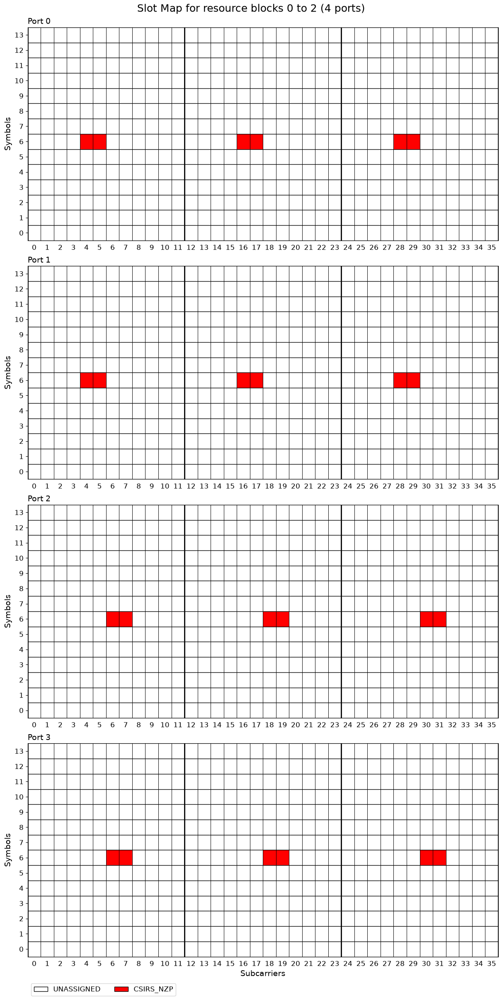

In [8]:
# Example: Row 4 of 38.211 Table 7.4.1.5.3-1
# 4 ports, one of the three bits is set in freqMap, CDM size is 2 and density is 1.
# CSI-RS resources are located in OFDM symbol 6 and REs (4, 5) and (6, 7).
# Note that REs (4, 5) are used for the first 2 ports and REs (6, 7) for the next 2.
csiRsConfig = CsiRsConfig([CsiRsSet("NZP", bwp, symbols=[6], freqMap="010", numPorts=4)])
csiRsConfig.print()
grid = bwp.createGrid(csiRsConfig.numPorts)
csiRsConfig.populateGrid(grid)
print("Grid Statistics:")
stats = grid.getStats()
for key, value in stats.items(): print("  %s: %d"%(key, value))
grid.drawMap(ports=range(csiRsConfig.numPorts), rbRange=(0,2));


CSI-RS Configuration: (1 Resource Sets)
  CSI-RS Resource Set 0:(1 NZP resources)
    Resource Set ID:      0
    Resource Type:        periodic
    Resource Blocks:      24 RBs starting at 0
    Slot Period:          4
    Num CSI-RS:           1
    CSI-RS 0:
      resourceId:         0
      numPorts:           4
      cdmSize:            2 (fd-CDM2)
      density:            1
      RE Indices:         2
      Symbol Indices:     6
      Table Row:          5
      Slot Offset:        0
      Power:              0 dB
      scramblingID:       0

Grid Statistics:
  GridSize: 16128
  UNASSIGNED: 15936
  CSIRS_NZP(0): 192


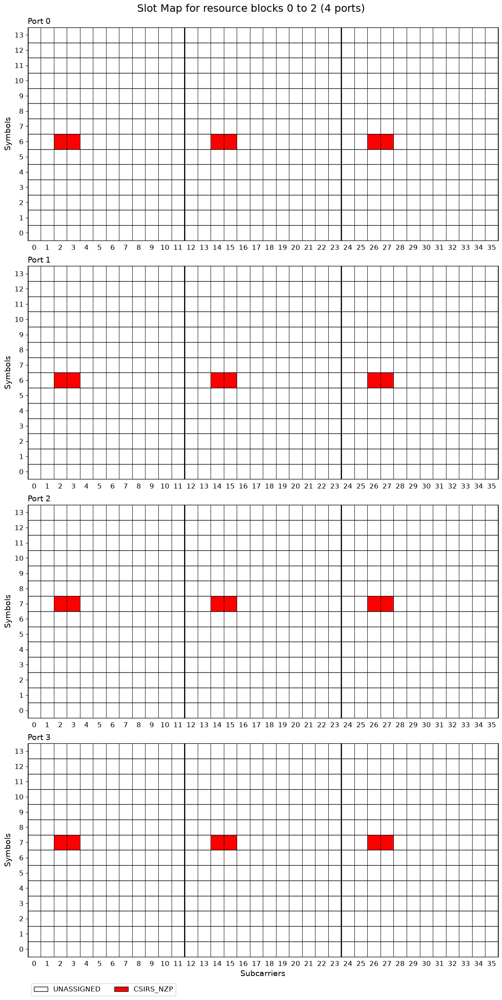

In [9]:
# Example: Row 5 of 38.211 Table 7.4.1.5.3-1
# 4 ports, one of the six bits is set in freqMap, CDM size is 2 and density is 1.
# CSI-RS resources are located in OFDM symbols 6,7 and REs (2, 3).
# Note that symbol 6 is used for the first 2 ports and symbol 7 for the next 2.
csiRsConfig = CsiRsConfig([CsiRsSet("NZP", bwp, symbols=[6], numPorts=4, freqMap="000010")])
csiRsConfig.print()
grid = bwp.createGrid(csiRsConfig.numPorts)
csiRsConfig.populateGrid(grid)
print("Grid Statistics:")
stats = grid.getStats()
for key, value in stats.items(): print("  %s: %d"%(key, value))
grid.drawMap(ports=range(csiRsConfig.numPorts), rbRange=(0,2));


CSI-RS Configuration: (1 Resource Sets)
  CSI-RS Resource Set 0:(1 NZP resources)
    Resource Set ID:      0
    Resource Type:        periodic
    Resource Blocks:      24 RBs starting at 0
    Slot Period:          4
    Num CSI-RS:           1
    CSI-RS 0:
      resourceId:         0
      numPorts:           8
      cdmSize:            2 (fd-CDM2)
      density:            1
      RE Indices:         0  4  6  10
      Symbol Indices:     6
      Table Row:          6
      Slot Offset:        0
      Power:              0 dB
      scramblingID:       0

Grid Statistics:
  GridSize: 32256
  UNASSIGNED: 31872
  CSIRS_NZP(0): 384


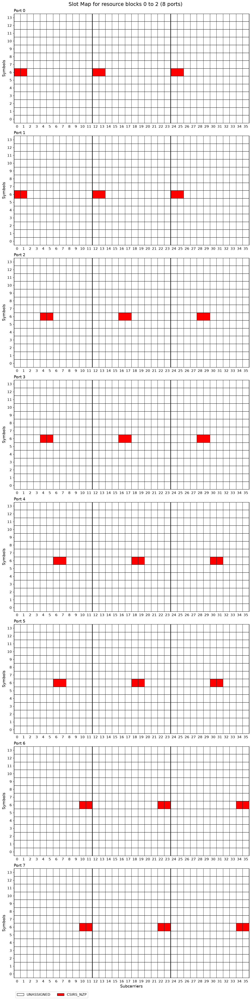

In [10]:
# Example: Row 6 of 38.211 Table 7.4.1.5.3-1
# 8 ports, four of the six bits are set in freqMap, CDM size is 2 and density is 1.
# CSI-RS resources are located in OFDM symbol 6 and REs (0, 1), (4, 5), (6, 7), and (10, 11).
csiRsConfig = CsiRsConfig([CsiRsSet("NZP", bwp, symbols=[6], numPorts=8, freqMap="101101")])
csiRsConfig.print()
grid = bwp.createGrid(csiRsConfig.numPorts)
csiRsConfig.populateGrid(grid)
print("Grid Statistics:")
stats = grid.getStats()
for key, value in stats.items(): print("  %s: %d"%(key, value))
grid.drawMap(ports=range(csiRsConfig.numPorts), rbRange=(0,2));


CSI-RS Configuration: (1 Resource Sets)
  CSI-RS Resource Set 0:(1 NZP resources)
    Resource Set ID:      0
    Resource Type:        periodic
    Resource Blocks:      24 RBs starting at 0
    Slot Period:          4
    Num CSI-RS:           1
    CSI-RS 0:
      resourceId:         0
      numPorts:           8
      cdmSize:            2 (fd-CDM2)
      density:            1
      RE Indices:         0  2
      Symbol Indices:     6
      Table Row:          7
      Slot Offset:        0
      Power:              0 dB
      scramblingID:       0

Grid Statistics:
  GridSize: 32256
  UNASSIGNED: 31872
  CSIRS_NZP(0): 384


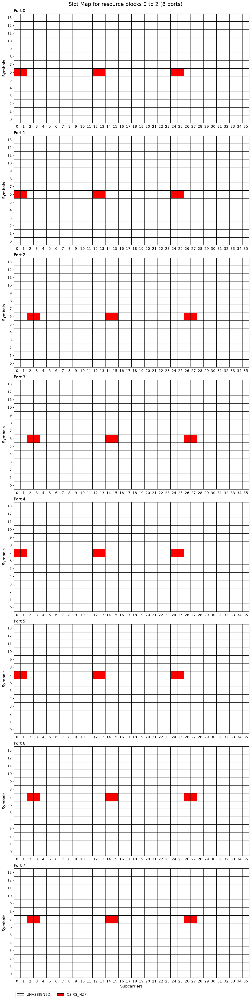

In [11]:
# Example: Row 7 of 38.211 Table 7.4.1.5.3-1
# 8 ports, two of the six bits are set in freqMap, CDM size is 2 and density is 1.
# CSI-RS resources are located in OFDM symbols 6 and 7 and REs (2, 3), and (8, 9).
csiRsConfig = CsiRsConfig([CsiRsSet("NZP", bwp, symbols=[6], numPorts=8, freqMap="000011")])
csiRsConfig.print()
grid = bwp.createGrid(csiRsConfig.numPorts)
csiRsConfig.populateGrid(grid)
print("Grid Statistics:")
stats = grid.getStats()
for key, value in stats.items(): print("  %s: %d"%(key, value))
grid.drawMap(ports=range(csiRsConfig.numPorts), rbRange=(0,2));


CSI-RS Configuration: (1 Resource Sets)
  CSI-RS Resource Set 0:(1 NZP resources)
    Resource Set ID:      0
    Resource Type:        periodic
    Resource Blocks:      24 RBs starting at 0
    Slot Period:          4
    Num CSI-RS:           1
    CSI-RS 0:
      resourceId:         0
      numPorts:           8
      cdmSize:            2 (fd-CDM2)
      density:            1
      RE Indices:         2  8
      Symbol Indices:     6
      Table Row:          7
      Slot Offset:        0
      Power:              0 dB
      scramblingID:       0

Grid Statistics:
  GridSize: 32256
  UNASSIGNED: 31872
  CSIRS_NZP(0): 384


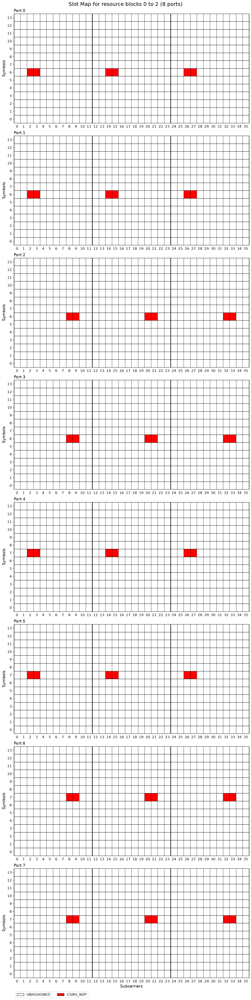

In [12]:
# Example: Row 7 of 38.211 Table 7.4.1.5.3-1
# 8 ports, two of the six bits are set in freqMap, CDM size is 2 and density is 1.
# CSI-RS resources are located in OFDM symbols 6 and 7 and REs (2, 3), and (8, 9).
csiRsConfig = CsiRsConfig([CsiRsSet("NZP", bwp, symbols=[6], numPorts=8, freqMap="010010")])
csiRsConfig.print()
grid = bwp.createGrid(csiRsConfig.numPorts)
csiRsConfig.populateGrid(grid)
print("Grid Statistics:")
stats = grid.getStats()
for key, value in stats.items(): print("  %s: %d"%(key, value))
grid.drawMap(ports=range(csiRsConfig.numPorts), rbRange=(0,2));


CSI-RS Configuration: (1 Resource Sets)
  CSI-RS Resource Set 0:(1 NZP resources)
    Resource Set ID:      0
    Resource Type:        periodic
    Resource Blocks:      24 RBs starting at 0
    Slot Period:          4
    Num CSI-RS:           1
    CSI-RS 0:
      resourceId:         0
      numPorts:           8
      cdmSize:            4 (cdm4-FD2-TD2)
      density:            1
      RE Indices:         2  8
      Symbol Indices:     6
      Table Row:          8
      Slot Offset:        0
      Power:              0 dB
      scramblingID:       0

Grid Statistics:
  GridSize: 32256
  UNASSIGNED: 31488
  CSIRS_NZP(0): 768


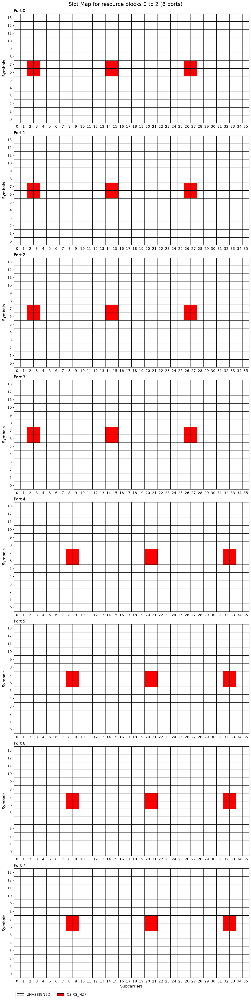

In [13]:
# Example: Row 8 of 38.211 Table 7.4.1.5.3-1
# 8 ports, two of the six bits are set in freqMap, CDM size is 4 and density is 1.
# CSI-RS resources are located in OFDM symbols 6 and 7 and REs (2, 3), and (8, 9).
csiRsConfig = CsiRsConfig([CsiRsSet("NZP", bwp, symbols=[6], numPorts=8, freqMap="010010", cdmSize=4)])
csiRsConfig.print()
grid = bwp.createGrid(csiRsConfig.numPorts)
csiRsConfig.populateGrid(grid)
print("Grid Statistics:")
stats = grid.getStats()
for key, value in stats.items(): print("  %s: %d"%(key, value))
grid.drawMap(ports=range(csiRsConfig.numPorts), rbRange=(0,2));


CSI-RS Configuration: (1 Resource Sets)
  CSI-RS Resource Set 0:(1 NZP resources)
    Resource Set ID:      0
    Resource Type:        periodic
    Resource Blocks:      24 RBs starting at 0
    Slot Period:          4
    Num CSI-RS:           1
    CSI-RS 0:
      resourceId:         0
      numPorts:           12
      cdmSize:            2 (fd-CDM2)
      density:            1
      RE Indices:         0  2  4  6  8  10
      Symbol Indices:     6
      Table Row:          9
      Slot Offset:        0
      Power:              0 dB
      scramblingID:       0

Grid Statistics:
  GridSize: 48384
  UNASSIGNED: 47808
  CSIRS_NZP(0): 576


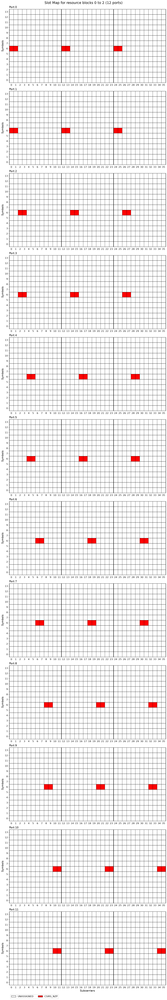

In [14]:
# Example: Row 9 of 38.211 Table 7.4.1.5.3-1
# 12 ports, all of the six bits are set in freqMap, CDM size is 2 and density is 1.
# CSI-RS resources are located in OFDM symbol 6 across all REs.
csiRsConfig = CsiRsConfig([CsiRsSet("NZP", bwp, symbols=[6], numPorts=12, cdmSize=2)])
csiRsConfig.print()
grid = bwp.createGrid(csiRsConfig.numPorts)
csiRsConfig.populateGrid(grid)
print("Grid Statistics:")
stats = grid.getStats()
for key, value in stats.items(): print("  %s: %d"%(key, value))
grid.drawMap(ports=range(csiRsConfig.numPorts), rbRange=(0,2));


CSI-RS Configuration: (1 Resource Sets)
  CSI-RS Resource Set 0:(1 NZP resources)
    Resource Set ID:      0
    Resource Type:        periodic
    Resource Blocks:      24 RBs starting at 0
    Slot Period:          4
    Num CSI-RS:           1
    CSI-RS 0:
      resourceId:         0
      numPorts:           12
      cdmSize:            4 (cdm4-FD2-TD2)
      density:            1
      RE Indices:         2  6  10
      Symbol Indices:     6
      Table Row:          10
      Slot Offset:        0
      Power:              0 dB
      scramblingID:       0

Grid Statistics:
  GridSize: 48384
  UNASSIGNED: 47232
  CSIRS_NZP(0): 1152


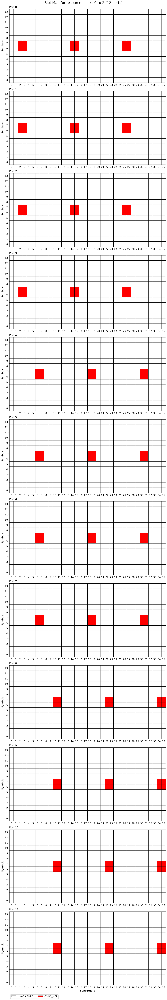

In [15]:
# Example: Row 10 of 38.211 Table 7.4.1.5.3-1
# 12 ports, three of the six bits are set in freqMap, CDM size is 4 and density is 1.
# CSI-RS resources are located in OFDM symbols 6 and 7 and REs (2, 3), (6, 7), and (10, 11).
csiRsConfig = CsiRsConfig([CsiRsSet("NZP", bwp, symbols=[6], numPorts=12, freqMap="101010", cdmSize=4)])
csiRsConfig.print()
grid = bwp.createGrid(csiRsConfig.numPorts)
csiRsConfig.populateGrid(grid)
print("Grid Statistics:")
stats = grid.getStats()
for key, value in stats.items(): print("  %s: %d"%(key, value))
grid.drawMap(ports=range(csiRsConfig.numPorts), rbRange=(0,2));


CSI-RS Configuration: (1 Resource Sets)
  CSI-RS Resource Set 0:(1 NZP resources)
    Resource Set ID:      0
    Resource Type:        periodic
    Resource Blocks:      24 RBs starting at 0
    Slot Period:          4
    Num CSI-RS:           1
    CSI-RS 0:
      resourceId:         0
      numPorts:           16
      cdmSize:            2 (fd-CDM2)
      density:            1
      RE Indices:         0  2  8  10
      Symbol Indices:     6
      Table Row:          11
      Slot Offset:        0
      Power:              0 dB
      scramblingID:       0

Grid Statistics:
  GridSize: 64512
  UNASSIGNED: 63744
  CSIRS_NZP(0): 768


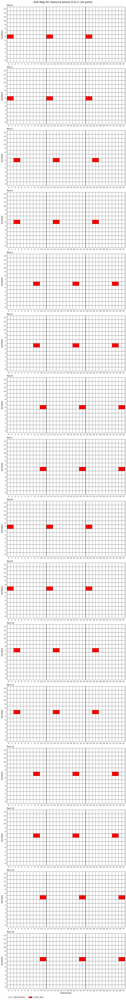

In [16]:
# Example: Row 11 of 38.211 Table 7.4.1.5.3-1
# 16 ports, four of the six bits are set in freqMap, CDM size is 2 and density is 1.
# CSI-RS resources are located in OFDM symbols 6 and 7 and REs (0, 1), (2, 3), (8, 9) and (10, 11).
# Note: This configuration also supports density = 0.5, which skips every other 
# PRB for CSI-RS allocation (default density = 1).
csiRsConfig = CsiRsConfig([CsiRsSet("NZP", bwp, symbols=[6], numPorts=16, freqMap="110011", cdmSize=2)])
csiRsConfig.print()
grid = bwp.createGrid(csiRsConfig.numPorts)
csiRsConfig.populateGrid(grid)
print("Grid Statistics:")
stats = grid.getStats()
for key, value in stats.items(): print("  %s: %d"%(key, value))
grid.drawMap(ports=range(csiRsConfig.numPorts), rbRange=(0,2));


CSI-RS Configuration: (1 Resource Sets)
  CSI-RS Resource Set 0:(1 NZP resources)
    Resource Set ID:      0
    Resource Type:        periodic
    Resource Blocks:      24 RBs starting at 0
    Slot Period:          4
    Num CSI-RS:           1
    CSI-RS 0:
      resourceId:         0
      numPorts:           16
      cdmSize:            4 (cdm4-FD2-TD2)
      density:            1
      RE Indices:         0  2  8  10
      Symbol Indices:     6
      Table Row:          12
      Slot Offset:        0
      Power:              0 dB
      scramblingID:       0

Grid Statistics:
  GridSize: 64512
  UNASSIGNED: 62976
  CSIRS_NZP(0): 1536


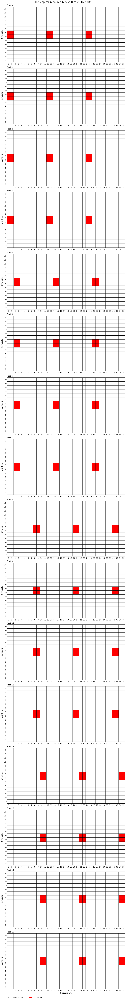

In [17]:
# Example: Row 12 of 38.211 Table 7.4.1.5.3-1
# 16 ports, four of the six bits are set in freqMap, CDM size is 4 and density is 1.
# CSI-RS resources are located in OFDM symbols 6 and 7 and REs (0, 1), (2, 3), (8, 9) and (10, 11).
# Note: This configuration also supports density = 0.5, which skips every other 
# PRB for CSI-RS allocation (default density = 1).
csiRsConfig = CsiRsConfig([CsiRsSet("NZP", bwp, symbols=[6], numPorts=16, freqMap="110011", cdmSize=4)])
csiRsConfig.print()
grid = bwp.createGrid(csiRsConfig.numPorts)
csiRsConfig.populateGrid(grid)
print("Grid Statistics:")
stats = grid.getStats()
for key, value in stats.items(): print("  %s: %d"%(key, value))
grid.drawMap(ports=range(csiRsConfig.numPorts), rbRange=(0,2));


CSI-RS Configuration: (1 Resource Sets)
  CSI-RS Resource Set 0:(1 NZP resources)
    Resource Set ID:      0
    Resource Type:        periodic
    Resource Blocks:      24 RBs starting at 0
    Slot Period:          4
    Num CSI-RS:           1
    CSI-RS 0:
      resourceId:         0
      numPorts:           24
      cdmSize:            2 (fd-CDM2)
      density:            1
      RE Indices:         2  6  10
      Symbol Indices:     4  8
      Table Row:          13
      Slot Offset:        0
      Power:              0 dB
      scramblingID:       0

Grid Statistics:
  GridSize: 96768
  UNASSIGNED: 95616
  CSIRS_NZP(0): 1152


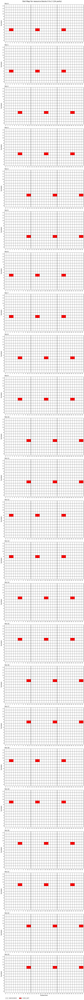

In [18]:
# Example: Row 13 of 38.211 Table 7.4.1.5.3-1
# 24 ports, three of the six bits are set in freqMap, CDM size is 2 and density is 1.
# CSI-RS resources are located in OFDM symbols 4, 5, 8, and 9 and REs (2, 3), (6, 7) and (10, 11).
# Note: This configuration also supports density = 0.5, which skips every other 
# PRB for CSI-RS allocation (default density = 1).
csiRsConfig = CsiRsConfig([CsiRsSet("NZP", bwp, symbols=[4,8], numPorts=24, freqMap="101010", cdmSize=2)])
csiRsConfig.print()
grid = bwp.createGrid(csiRsConfig.numPorts)
csiRsConfig.populateGrid(grid)
print("Grid Statistics:")
stats = grid.getStats()
for key, value in stats.items(): print("  %s: %d"%(key, value))
grid.drawMap(ports=range(csiRsConfig.numPorts), rbRange=(0,2));


CSI-RS Configuration: (1 Resource Sets)
  CSI-RS Resource Set 0:(1 NZP resources)
    Resource Set ID:      0
    Resource Type:        periodic
    Resource Blocks:      24 RBs starting at 0
    Slot Period:          4
    Num CSI-RS:           1
    CSI-RS 0:
      resourceId:         0
      numPorts:           24
      cdmSize:            4 (cdm4-FD2-TD2)
      density:            1
      RE Indices:         2  6  10
      Symbol Indices:     4  8
      Table Row:          14
      Slot Offset:        0
      Power:              0 dB
      scramblingID:       0

Grid Statistics:
  GridSize: 96768
  UNASSIGNED: 94464
  CSIRS_NZP(0): 2304


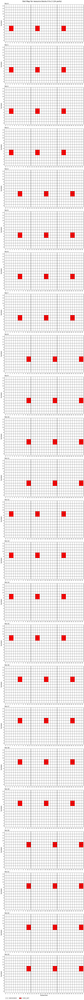

In [19]:
# Example: Row 14 of 38.211 Table 7.4.1.5.3-1
# 24 ports, three of the six bits are set in freqMap, CDM size is 4 and density is 1.
# CSI-RS resources are located in OFDM symbols 4, 5, 8, and 9 and REs (2, 3), (6, 7) and (10, 11).
# Note: This configuration also supports density = 0.5, which skips every other 
# PRB for CSI-RS allocation (default density = 1).
csiRsConfig = CsiRsConfig([CsiRsSet("NZP", bwp, symbols=[4,8], numPorts=24, freqMap="101010", cdmSize=4)])
csiRsConfig.print()
grid = bwp.createGrid(csiRsConfig.numPorts)
csiRsConfig.populateGrid(grid)
print("Grid Statistics:")
stats = grid.getStats()
for key, value in stats.items(): print("  %s: %d"%(key, value))
grid.drawMap(ports=range(csiRsConfig.numPorts), rbRange=(0,2));


CSI-RS Configuration: (1 Resource Sets)
  CSI-RS Resource Set 0:(1 NZP resources)
    Resource Set ID:      0
    Resource Type:        periodic
    Resource Blocks:      24 RBs starting at 0
    Slot Period:          4
    Num CSI-RS:           1
    CSI-RS 0:
      resourceId:         0
      numPorts:           24
      cdmSize:            8 (cdm8-FD2-TD4)
      density:            1
      RE Indices:         2  6  10
      Symbol Indices:     5
      Table Row:          15
      Slot Offset:        0
      Power:              0 dB
      scramblingID:       0

Grid Statistics:
  GridSize: 96768
  UNASSIGNED: 92160
  CSIRS_NZP(0): 4608


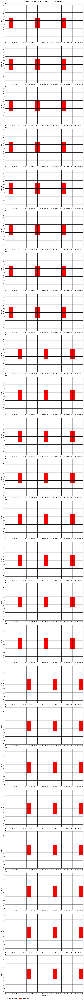

In [20]:
# Example: Row 15 of 38.211 Table 7.4.1.5.3-1
# 24 ports, three of the six bits are set in freqMap, CDM size is 8,and density is 1.
# CSI-RS resources are located in OFDM symbols 5, 6, 7, and 8 and REs (2, 3), (6, 7) and (10, 11).
# Note: This configuration also supports density = 0.5, which skips every other 
# PRB for CSI-RS allocation (default density = 1).
csiRsConfig = CsiRsConfig([CsiRsSet("NZP", bwp, symbols=[5], numPorts=24, freqMap="101010", cdmSize=8)])
csiRsConfig.print()
grid = bwp.createGrid(csiRsConfig.numPorts)
csiRsConfig.populateGrid(grid)
print("Grid Statistics:")
stats = grid.getStats()
for key, value in stats.items(): print("  %s: %d"%(key, value))
grid.drawMap(ports=range(csiRsConfig.numPorts), rbRange=(0,2));


CSI-RS Configuration: (1 Resource Sets)
  CSI-RS Resource Set 0:(1 NZP resources)
    Resource Set ID:      0
    Resource Type:        periodic
    Resource Blocks:      24 RBs starting at 0
    Slot Period:          4
    Num CSI-RS:           1
    CSI-RS 0:
      resourceId:         0
      numPorts:           32
      cdmSize:            2 (fd-CDM2)
      density:            1
      RE Indices:         0  2  8  10
      Symbol Indices:     4  8
      Table Row:          16
      Slot Offset:        0
      Power:              0 dB
      scramblingID:       0

Grid Statistics:
  GridSize: 129024
  UNASSIGNED: 127488
  CSIRS_NZP(0): 1536


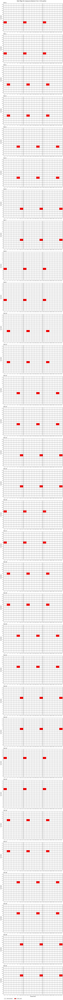

In [21]:
# Example: Row 16 of 38.211 Table 7.4.1.5.3-1
# 32 ports, four of the six bits are set in freqMap, CDM size is 2 and density is 1.
# CSI-RS resources are located in OFDM symbols 4, 5, 8, and 9 and REs (0, 1),(2, 3),(8, 9) and (10, 11).
# Note: This configuration also supports density = 0.5, which skips every other 
# PRB for CSI-RS allocation (default density = 1).
csiRsConfig = CsiRsConfig([CsiRsSet("NZP", bwp, symbols=[4,8], numPorts=32, freqMap="110011", cdmSize=2)])
csiRsConfig.print()
grid = bwp.createGrid(csiRsConfig.numPorts)
csiRsConfig.populateGrid(grid)
print("Grid Statistics:")
stats = grid.getStats()
for key, value in stats.items(): print("  %s: %d"%(key, value))
grid.drawMap(ports=range(csiRsConfig.numPorts), rbRange=(0,2));


CSI-RS Configuration: (1 Resource Sets)
  CSI-RS Resource Set 0:(1 NZP resources)
    Resource Set ID:      0
    Resource Type:        periodic
    Resource Blocks:      24 RBs starting at 0
    Slot Period:          4
    Num CSI-RS:           1
    CSI-RS 0:
      resourceId:         0
      numPorts:           32
      cdmSize:            4 (cdm4-FD2-TD2)
      density:            1
      RE Indices:         0  2  8  10
      Symbol Indices:     2  8
      Table Row:          17
      Slot Offset:        0
      Power:              0 dB
      scramblingID:       0

Grid Statistics:
  GridSize: 129024
  UNASSIGNED: 125952
  CSIRS_NZP(0): 3072


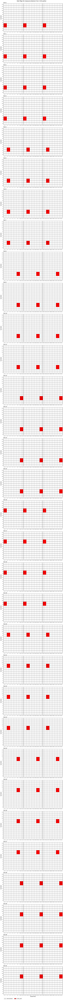

In [22]:
# Example: Row 17 of 38.211 Table 7.4.1.5.3-1
# 32 ports, four of the six bits are set in freqMap, CDM size is 4 and density is 1.
# CSI-RS resources are located in OFDM symbols 2, 3, 8, and 9 and REs (0, 1),(2, 3),(8, 9) and (10, 11).
# Note: This configuration also supports density = 0.5, which skips every other 
# PRB for CSI-RS allocation (default density = 1).
csiRsConfig = CsiRsConfig([CsiRsSet("NZP", bwp, symbols=[2,8], numPorts=32, freqMap="110011", cdmSize=4)])
csiRsConfig.print()
grid = bwp.createGrid(csiRsConfig.numPorts)
csiRsConfig.populateGrid(grid)
print("Grid Statistics:")
stats = grid.getStats()
for key, value in stats.items(): print("  %s: %d"%(key, value))
grid.drawMap(ports=range(csiRsConfig.numPorts), rbRange=(0,2));


CSI-RS Configuration: (1 Resource Sets)
  CSI-RS Resource Set 0:(1 NZP resources)
    Resource Set ID:      0
    Resource Type:        periodic
    Resource Blocks:      24 RBs starting at 0
    Slot Period:          4
    Num CSI-RS:           1
    CSI-RS 0:
      resourceId:         0
      numPorts:           32
      cdmSize:            8 (cdm8-FD2-TD4)
      density:            1
      RE Indices:         0  2  8  10
      Symbol Indices:     6
      Table Row:          18
      Slot Offset:        0
      Power:              0 dB
      scramblingID:       0

Grid Statistics:
  GridSize: 129024
  UNASSIGNED: 122880
  CSIRS_NZP(0): 6144


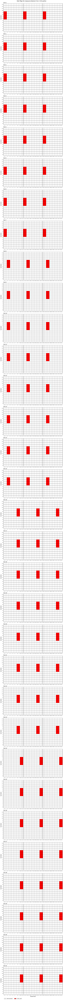

In [23]:
# Example: Row 18 of 38.211 Table 7.4.1.5.3-1
# 32 ports, four of the six bits are set in freqMap, CDM size is 8 and density is 1.
# CSI-RS resources are located in OFDM symbols 6, 7, 8, and 9 and REs (0, 1),(2, 3),(8, 9) and (10, 11).
# Note: This configuration also supports density = 0.5, which skips every other 
# PRB for CSI-RS allocation (default density = 1).
csiRsConfig = CsiRsConfig([CsiRsSet("NZP", bwp, symbols=[6], numPorts=32, freqMap="110011", cdmSize=8)])
csiRsConfig.print()
grid = bwp.createGrid(csiRsConfig.numPorts)
csiRsConfig.populateGrid(grid)
print("Grid Statistics:")
stats = grid.getStats()
for key, value in stats.items(): print("  %s: %d"%(key, value))
grid.drawMap(ports=range(csiRsConfig.numPorts), rbRange=(0,2));